# import libraries

In [1]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
import albumentations as A
import numpy as np
from tensorflow.keras.utils import Sequence
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split

# Create DataFrame with image and mask paths
import os

In [2]:
 # Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Create DataFrame with image and mask paths

In [6]:
image_dir = '/content/drive/MyDrive/segmentation/images'
mask_dir = '/content/drive/MyDrive/segmentation/masks'

# Get all image files
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Create DataFrame
df = pd.DataFrame({
    'images': [os.path.join(image_dir, f) for f in image_files],
    'masks': [os.path.join(mask_dir, f) for f in image_files]
})

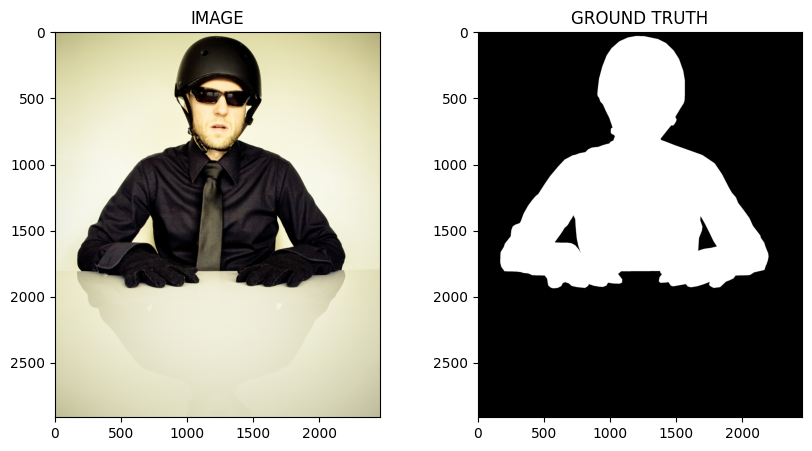

In [ ]:
# Display sample image and mask
row = df.iloc[0]
image_path = row['images']
mask_path = row['masks']

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) / 255.0

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.set_title('IMAGE')
ax1.imshow(image)

ax2.set_title('GROUND TRUTH')
ax2.imshow(mask, cmap='gray')

# Data loading and preprocessing

In [7]:
IMG_SIZE = (128, 128)

def load_and_preprocess(img_path, mask_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = img / 255.0  # normalize to [0,1]

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)  # 1 channel for mask
    mask = tf.image.resize(mask, IMG_SIZE)
    mask = mask / 255.0  # normalize mask too

    return img, mask

# Split dataset
image_paths = df['images'].values
mask_paths = df['masks'].values

train_images, val_images, train_masks, val_masks = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=42)

# Training dataset
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_masks))
train_dataset = train_dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(16).prefetch(tf.data.AUTOTUNE)

# Validation dataset
val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_masks))
val_dataset = val_dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(16).prefetch(tf.data.AUTOTUNE)

# Data augmentation

In [8]:
transform = A.Compose([
    A.Resize(128, 128),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=30, p=0.5),
])

class Dataset(Sequence):
    def __init__(self, image_paths, mask_paths, batch_size=16, augment=False):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.augment = augment

    def __len__(self):
        return len(self.image_paths) // self.batch_size

    def __getitem__(self, idx):
        X, Y = [], []
        for i in range(idx * self.batch_size, (idx + 1) * self.batch_size):
            img = cv2.imread(self.image_paths[i])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            mask = cv2.imread(self.mask_paths[i], cv2.IMREAD_GRAYSCALE)

            if self.augment:
                augmented = transform(image=img, mask=mask)
                img, mask = augmented['image'], augmented['mask']

            img = img / 255.0
            mask = mask / 255.0
            mask = np.expand_dims(mask, axis=-1)

            X.append(img)
            Y.append(mask)

        return np.array(X), np.array(Y)

# U-Net model architecture

In [3]:
def conv_block(inputs, filters):
    x = layers.Conv2D(filters, 3, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x

def encoder_block(inputs, filters):
    x = conv_block(inputs, filters)
    p = layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, filters):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(inputs)
    x = layers.Concatenate()([x, skip_features])
    x = conv_block(x, filters)
    return x

def build_unet(input_shape, num_classes):
    inputs = layers.Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bottleneck
    b1 = conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output
    outputs = layers.Conv2D(num_classes, 1, padding="same", activation="sigmoid")(d4)

    return Model(inputs, outputs, name="U-Net")

def iou_metric(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + 1e-7)

# Create and compile model

In [ ]:
model = build_unet(input_shape=(128, 128, 3), num_classes=1)
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy', iou_metric])

model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ re_lu[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ re_lu_2[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_4[0][0]  

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

# Set up model checkpoint and training

In [ ]:
os.makedirs('/content/drive/MyDrive/segmentation/models', exist_ok=True)

# Create ModelCheckpoint callback
checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/segmentation/models/model_epoch_{epoch:02d}.h5',
    save_best_only=False,  # Save every epoch
    save_weights_only=False,  # Save the entire model
    monitor='val_loss',  # Monitor validation loss
    verbose=1  # Print a message when a model is saved
)

# Train model with checkpoint callback
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=25,
    batch_size=16,
    callbacks=[checkpoint]
)


Epoch 1/25
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.7366 - iou_metric: 0.4230 - loss: 0.5297 
Epoch 1: saving model to /content/drive/MyDrive/segmentation/models/model_epoch_01.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 2272s 17s/step - accuracy: 0.7369 - iou_metric: 0.4235 - loss: 0.5291 - val_accuracy: 0.7362 - val_iou_metric: 0.3254 - val_loss: 6.5215
Epoch 2/25
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - accuracy: 0.8322 - iou_metric: 0.5723 - loss: 0.3712
Epoch 2: saving model to /content/drive/MyDrive/segmentation/models/model_epoch_02.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 146s 762ms/step - accuracy: 0.8323 - iou_metric: 0.5724 - loss: 0.3711 - val_accuracy: 0.7602 - val_iou_metric: 0.4373 - val_loss: 0.7079
Epoch 3/25
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - accuracy: 0.8522 - iou_metric: 0.6163 - loss: 0.3344
Epoch 3: saving model to /content/drive/MyDrive/segmentation/models/model_epoch_03.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 138s 732ms/step - accuracy: 0.8523 - iou_metric: 0.61

# Plot training history and Visualize predictions


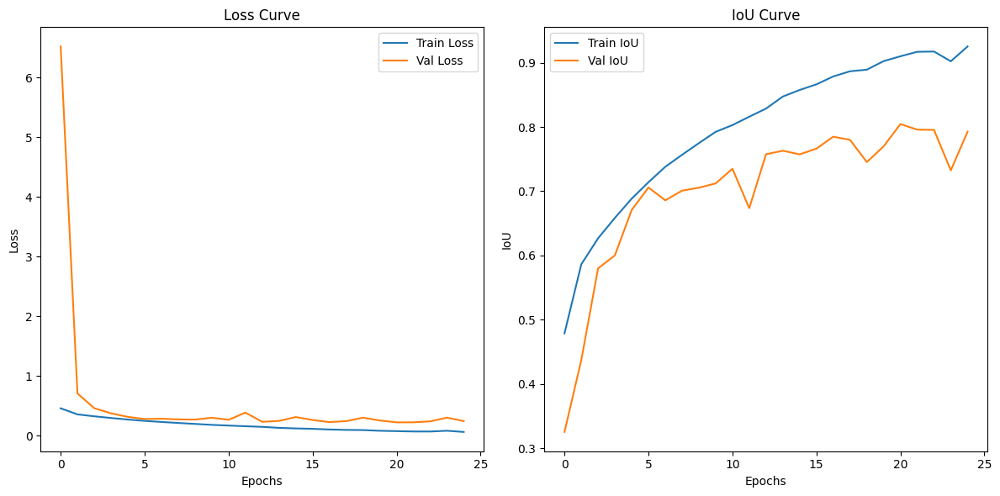


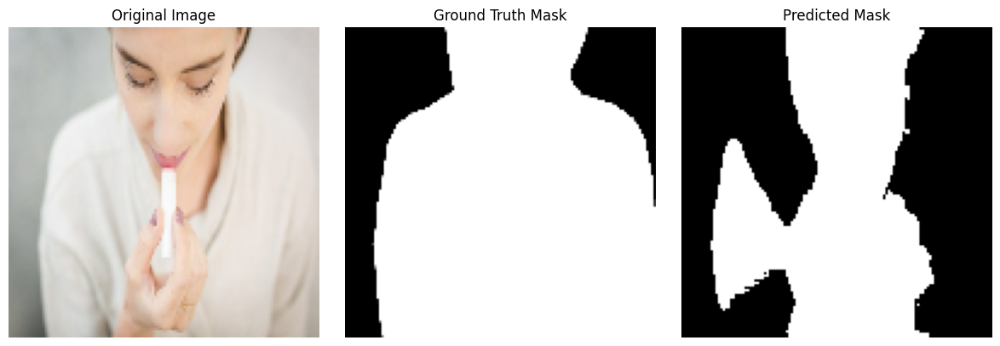

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Loss Curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# IoU curve
plt.subplot(1, 2, 2)
plt.plot(history.history['iou_metric'], label='Train IoU')
plt.plot(history.history['val_iou_metric'], label='Val IoU')
plt.title("IoU Curve")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.legend()

plt.tight_layout()
plt.show()

for images, masks in val_dataset.take(1):
    sample_image = images[2]
    sample_mask = masks[2]
    break

pred_mask = model.predict(tf.expand_dims(sample_image, axis=0))[0]
pred_mask = tf.cast(pred_mask > 0.5, tf.float32)

plt.figure(figsize=(12, 4))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(sample_image)
plt.title("Original Image")
plt.axis("off")

# Ground Truth Mask
plt.subplot(1, 3, 2)
plt.imshow(tf.squeeze(sample_mask), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis("off")

# Predicted Mask
plt.subplot(1, 3, 3)
plt.imshow(tf.squeeze(pred_mask), cmap='gray')
plt.title("Predicted Mask")
plt.axis("off")

plt.tight_layout()
plt.show()

# Testing

Results with Histogram Equalization:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


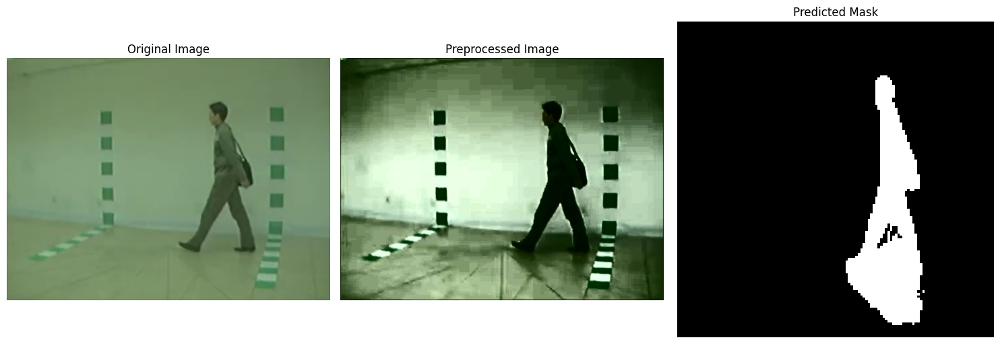


Results with Statistical Normalization:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


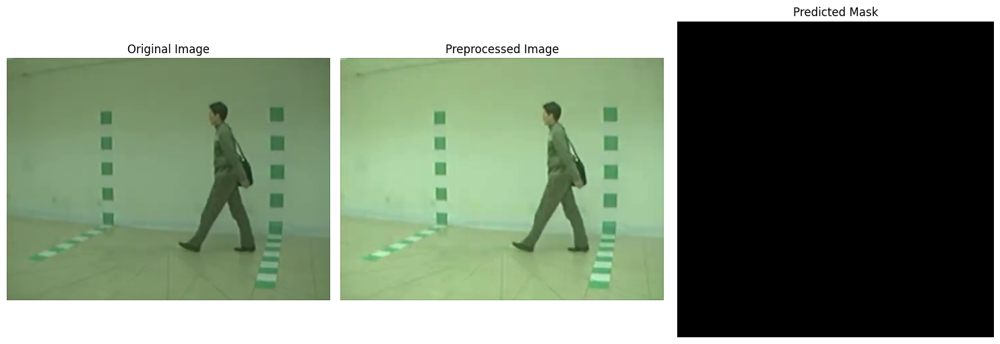

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the best model (epoch 21)
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

def preprocess_single_image(image_path, normalize_method='histogram'):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original size for visualization
    original_img = img.copy()

    if normalize_method == 'histogram':
        # Apply histogram equalization to each channel
        img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
        img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)

    elif normalize_method == 'normalize':
        # Simple normalization: subtract mean and divide by std
        img = (img - np.mean(img)) / np.std(img)
        # Rescale to [0,1] range
        img = (img - img.min()) / (img.max() - img.min())

    # Resize for model input
    img_resized = cv2.resize(img, (128, 128))

    # Normalize to [0,1]
    img_resized = img_resized / 255.0

    return original_img, img, img_resized

def visualize_prediction(original_img, preprocessed_img, predicted_mask):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Preprocessed Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Test with both preprocessing methods
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0027.jpg'  # Replace with your image path

# Try histogram equalization
print("Results with Histogram Equalization:")
original_img, preprocessed_img, model_input = preprocess_single_image(image_path, normalize_method='histogram')
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
prediction = tf.cast(prediction > 0.5, tf.float32)
visualize_prediction(original_img, preprocessed_img, prediction)

# Try normalization
print("\nResults with Statistical Normalization:")
original_img, preprocessed_img, model_input = preprocess_single_image(image_path, normalize_method='normalize')
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
prediction = tf.cast(prediction > 0.5, tf.float32)
visualize_prediction(original_img, preprocessed_img, prediction)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


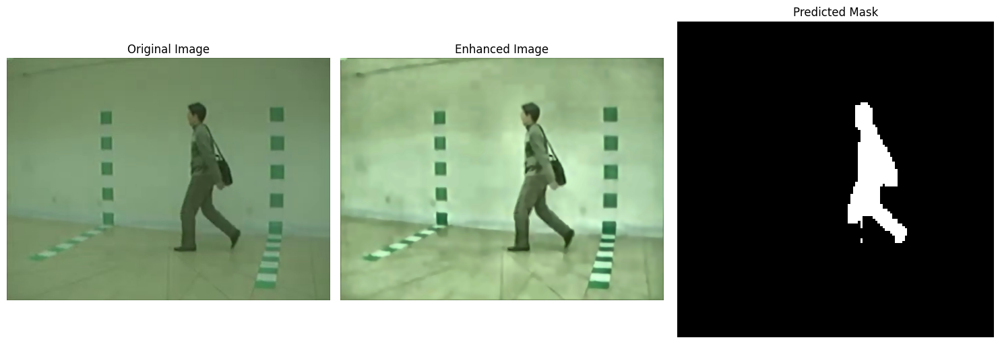

True

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def enhance_image(img):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge channels
    lab = cv2.merge((l, a, b))

    # Convert back to RGB
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Adjust contrast and brightness
    alpha = 1.2  # Contrast control (1.0-3.0)
    beta = 10    # Brightness control (0-100)
    enhanced = cv2.convertScaleAbs(enhanced, alpha=alpha, beta=beta)

    # Denoise
    enhanced = cv2.fastNlMeansDenoisingColored(enhanced, None, 10, 10, 7, 21)

    return enhanced

def preprocess_single_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original for visualization
    original_img = img.copy()

    # Apply enhancement
    enhanced = enhance_image(img)

    # Resize for model input (preserve aspect ratio)
    target_size = (128, 128)
    h, w = enhanced.shape[:2]
    aspect = w/h

    if aspect > 1:
        new_w = target_size[0]
        new_h = int(new_w/aspect)
    else:
        new_h = target_size[1]
        new_w = int(new_h*aspect)

    enhanced_resized = cv2.resize(enhanced, (new_w, new_h))

    # Create blank target size image
    model_input = np.zeros((target_size[0], target_size[1], 3))

    # Calculate center offset
    x_offset = (target_size[0] - new_w) // 2
    y_offset = (target_size[1] - new_h) // 2

    # Place resized image in center
    model_input[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = enhanced_resized

    # Normalize to [0,1]
    model_input = model_input / 255.0

    return original_img, enhanced, model_input

def visualize_prediction(original_img, preprocessed_img, predicted_mask, save_path=None):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Enhanced Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

# Load the best model (epoch 21)
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

# Test with enhanced preprocessing
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0031.jpg'  # Replace with your image path
original_img, enhanced_img, model_input = preprocess_single_image(image_path)

# Make prediction
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
prediction = tf.cast(prediction > 0.5, tf.float32)

# Visualize results
visualize_prediction(original_img, enhanced_img, prediction)

# Optionally save the enhanced image and prediction
cv2.imwrite('/content/drive/MyDrive/segmentation/enhanced_image.jpg',
            cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2BGR))
cv2.imwrite('/content/drive/MyDrive/segmentation/predicted_mask.jpg',
            tf.squeeze(prediction).numpy() * 255)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


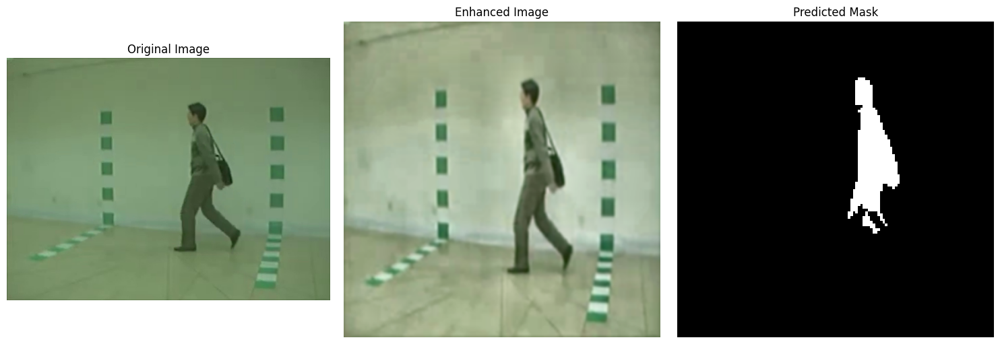

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def enhance_image(img):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE with reduced clip limit for less aggressive contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge channels
    lab = cv2.merge((l, a, b))

    # Convert back to RGB
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Reduce green tint
    enhanced = enhanced.astype(float)
    enhanced[:,:,1] = enhanced[:,:,1] * 0.9  # Reduce green channel
    enhanced = np.clip(enhanced, 0, 255).astype(np.uint8)

    # Increase size to 256x256 for better detail
    enhanced = cv2.resize(enhanced, (256, 256))

    return enhanced

def preprocess_single_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original for visualization
    original_img = img.copy()

    # Apply enhancement
    enhanced = enhance_image(img)

    # Additional preprocessing
    # 1. Increase contrast between subject and background
    enhanced = cv2.convertScaleAbs(enhanced, alpha=1.3, beta=0)

    # 2. Apply slight blur to reduce noise but preserve edges
    enhanced = cv2.GaussianBlur(enhanced, (3,3), 0)

    # 3. Normalize to [0,1] with improved scaling
    model_input = enhanced.astype(float)
    model_input = (model_input - model_input.min()) / (model_input.max() - model_input.min())

    # 4. Resize back to model input size while maintaining aspect ratio
    h, w = model_input.shape[:2]
    aspect = w/h

    if aspect > 1:
        new_w = 128
        new_h = int(128/aspect)
    else:
        new_h = 128
        new_w = int(128*aspect)

    model_input = cv2.resize(model_input, (new_w, new_h))

    # 5. Pad to square if needed
    final_input = np.zeros((128, 128, 3))
    y_offset = (128 - new_h) // 2
    x_offset = (128 - new_w) // 2
    final_input[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = model_input

    return original_img, enhanced, final_input

def visualize_prediction(original_img, preprocessed_img, predicted_mask):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Enhanced Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Load the best model (epoch 21)
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

# Test with enhanced preprocessing
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0031.jpg'
original_img, enhanced_img, model_input = preprocess_single_image(image_path)

# Make prediction with threshold adjustment
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
# Lower threshold to capture more of the body
prediction = tf.cast(prediction > 0.3, tf.float32)  # Changed from 0.5 to 0.3

# Visualize results
visualize_prediction(original_img, enhanced_img, prediction)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


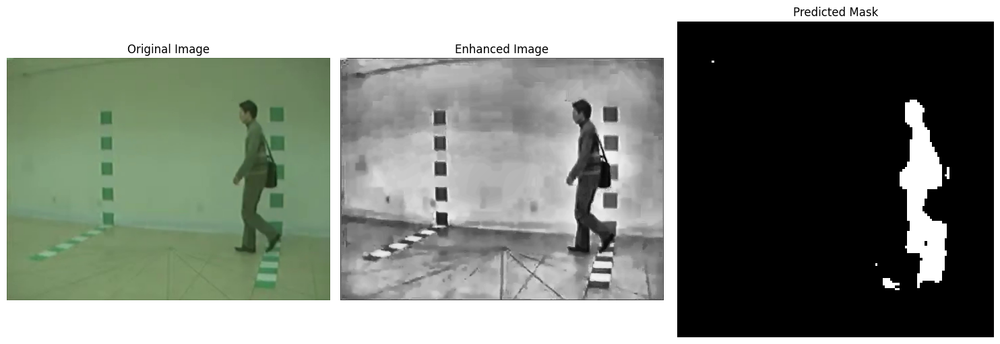

True

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def enhance_image(img):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE with slightly adjusted parameters
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Enhance edges in the L channel
    edge_kernel = np.array([[-1,-1,-1],
                          [-1, 9,-1],
                          [-1,-1,-1]])
    l = cv2.filter2D(l, -1, edge_kernel)

    # Merge channels
    lab = cv2.merge((l, a, b))

    # Convert back to RGB
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # First denoising pass (gentle)
    enhanced = cv2.fastNlMeansDenoisingColored(enhanced, None, 5, 5, 7, 21)

    # Adjust contrast and brightness with fine-tuned parameters
    alpha = 1.15  # Slightly reduced contrast
    beta = 5      # Reduced brightness boost
    enhanced = cv2.convertScaleAbs(enhanced, alpha=alpha, beta=beta)

    # Apply bilateral filter to preserve edges while smoothing
    enhanced = cv2.bilateralFilter(enhanced, 9, 75, 75)

    # Additional local contrast enhancement
    gray = cv2.cvtColor(enhanced, cv2.COLOR_RGB2GRAY)
    clahe2 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
    enhanced_gray = clahe2.apply(gray)

    # Blend the enhanced gray with color image
    enhanced = cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2RGB)
    enhanced = cv2.addWeighted(enhanced, 0.3, cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2RGB), 0.7, 0)

    return enhanced

def preprocess_single_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Failed to load image at {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original for visualization
    original_img = img.copy()

    # Apply enhancement
    enhanced = enhance_image(img)

    # Resize for model input (preserve aspect ratio)
    target_size = (128, 128)
    h, w = enhanced.shape[:2]
    aspect = w/h

    if aspect > 1:
        new_w = target_size[0]
        new_h = int(new_w/aspect)
    else:
        new_h = target_size[1]
        new_w = int(new_h*aspect)

    # Use LANCZOS interpolation for better quality downscaling
    enhanced_resized = cv2.resize(enhanced, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4)

    # Create blank target size image
    model_input = np.zeros((target_size[0], target_size[1], 3))

    # Calculate center offset
    x_offset = (target_size[0] - new_w) // 2
    y_offset = (target_size[1] - new_h) // 2

    # Place resized image in center
    model_input[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = enhanced_resized

    # Normalize to [0,1] with improved scaling
    model_input = (model_input - model_input.min()) / (model_input.max() - model_input.min() + 1e-8)

    return original_img, enhanced, model_input

def visualize_prediction(original_img, preprocessed_img, predicted_mask, save_path=None):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Enhanced Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

# Load the best model (epoch 21)
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

# Test with enhanced preprocessing
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0020.jpg'
original_img, enhanced_img, model_input = preprocess_single_image(image_path)

# Make prediction with slightly adjusted threshold
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
prediction = tf.cast(prediction > 0.45, tf.float32)  # Adjusted threshold

# Visualize results
visualize_prediction(original_img, enhanced_img, prediction)

# Save with improved quality
cv2.imwrite('/content/drive/MyDrive/segmentation/enhanced_image.jpg',
            cv2.cvtColor((enhanced_img * 255).astype(np.uint8), cv2.COLOR_RGB2BGR),
            [cv2.IMWRITE_JPEG_QUALITY, 100])
cv2.imwrite('/content/drive/MyDrive/segmentation/predicted_mask.jpg',
            (tf.squeeze(prediction).numpy() * 255).astype(np.uint8),
            [cv2.IMWRITE_PNG_COMPRESSION, 0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


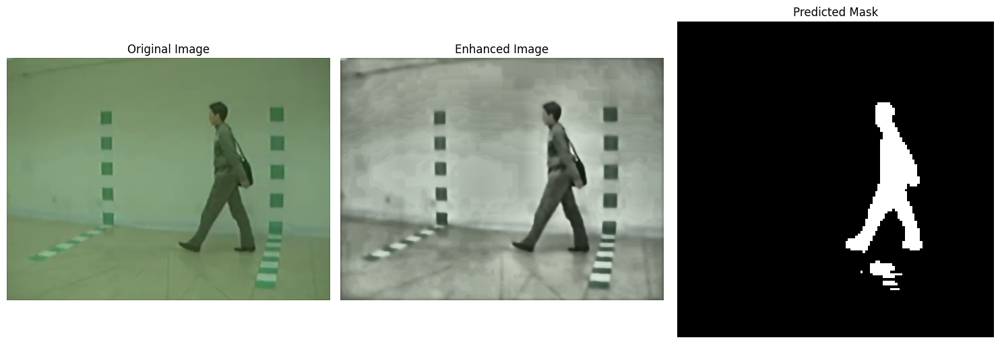

True

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def enhance_image(img):
    # Initial denoising to remove base noise
    img_denoised = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

    # Convert to LAB color space
    lab = cv2.cvtColor(img_denoised, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE with reduced clip limit to prevent noise amplification
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge channels
    lab = cv2.merge((l, a, b))
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Apply bilateral filter for edge-preserving smoothing
    enhanced = cv2.bilateralFilter(enhanced, 9, 75, 75)

    # Adjust contrast and brightness (reduced values to minimize noise)
    alpha = 1.1  # Reduced contrast
    beta = 5     # Reduced brightness
    enhanced = cv2.convertScaleAbs(enhanced, alpha=alpha, beta=beta)

    # Convert to grayscale for additional processing
    gray = cv2.cvtColor(enhanced, cv2.COLOR_RGB2GRAY)

    # Second CLAHE pass with very mild settings
    clahe2 = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(4,4))
    enhanced_gray = clahe2.apply(gray)

    # Convert back to RGB
    enhanced_color = cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2RGB)

    # Blend with color image (more weight to grayscale for noise reduction)
    enhanced = cv2.addWeighted(enhanced, 0.3, enhanced_color, 0.7, 0)

    # Final gentle bilateral filter
    enhanced = cv2.bilateralFilter(enhanced, 5, 50, 50)

    return enhanced

def preprocess_single_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Failed to load image at {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original for visualization
    original_img = img.copy()

    # Apply enhancement
    enhanced = enhance_image(img)

    # Resize for model input (preserve aspect ratio)
    target_size = (128, 128)
    h, w = enhanced.shape[:2]
    aspect = w/h

    if aspect > 1:
        new_w = target_size[0]
        new_h = int(new_w/aspect)
    else:
        new_h = target_size[1]
        new_w = int(new_h*aspect)

    # Use LANCZOS interpolation for better quality downscaling
    enhanced_resized = cv2.resize(enhanced, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4)

    # Create blank target size image
    model_input = np.zeros((target_size[0], target_size[1], 3))

    # Calculate center offset
    x_offset = (target_size[0] - new_w) // 2
    y_offset = (target_size[1] - new_h) // 2

    # Place resized image in center
    model_input[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = enhanced_resized

    # Normalize to [0,1] with improved scaling
    model_input = (model_input - model_input.min()) / (model_input.max() - model_input.min() + 1e-8)

    return original_img, enhanced, model_input

def visualize_prediction(original_img, preprocessed_img, predicted_mask, save_path=None):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Enhanced Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

# Load the best model (epoch 21)
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

# Test with enhanced preprocessing
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0027.jpg'
original_img, enhanced_img, model_input = preprocess_single_image(image_path)

# Make prediction
prediction = best_model.predict(np.expand_dims(model_input, axis=0))[0]
prediction = tf.cast(prediction > 0.45, tf.float32)

# Visualize results
visualize_prediction(original_img, enhanced_img, prediction)

# Save with improved quality
cv2.imwrite('/content/drive/MyDrive/segmentation/enhanced_image.jpg',
            cv2.cvtColor((enhanced_img * 255).astype(np.uint8), cv2.COLOR_RGB2BGR),
            [cv2.IMWRITE_JPEG_QUALITY, 100])
cv2.imwrite('/content/drive/MyDrive/segmentation/predicted_mask.jpg',
            (tf.squeeze(prediction).numpy() * 255).astype(np.uint8),
            [cv2.IMWRITE_PNG_COMPRESSION, 0])

# Best results

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


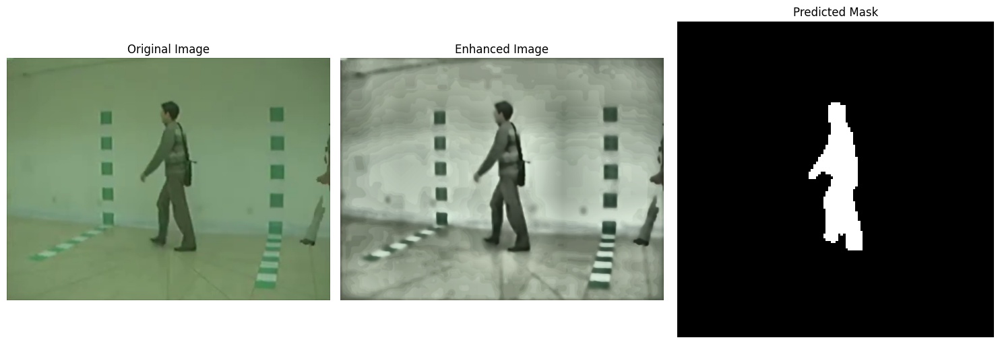


Processing: frame_0013.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


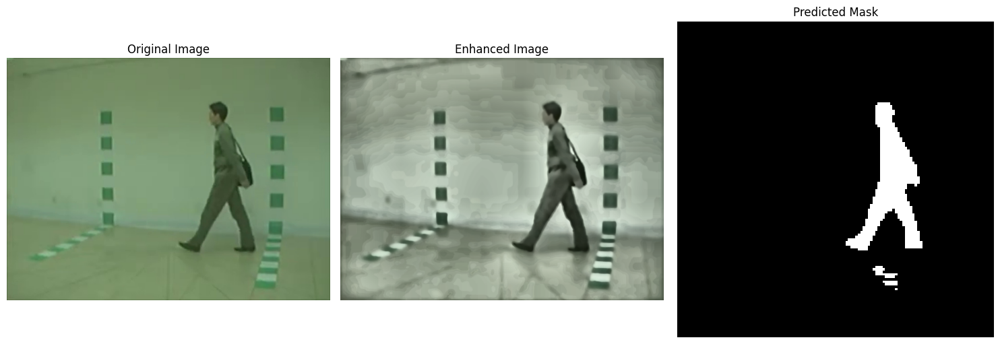


Processing: frame_0012.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


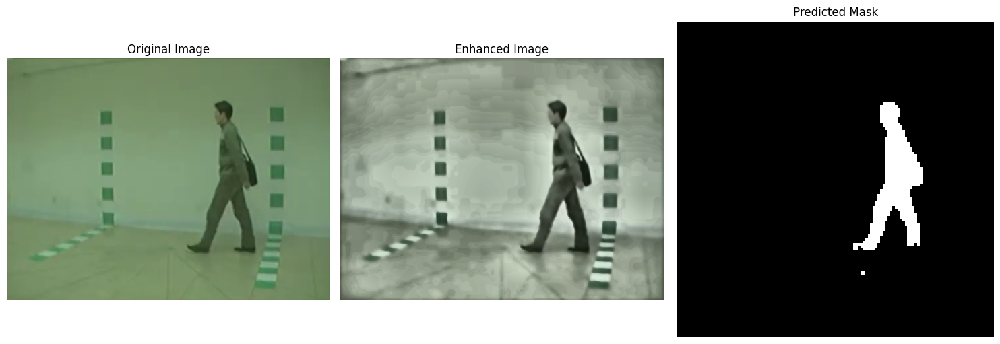


Processing: frame_0006.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


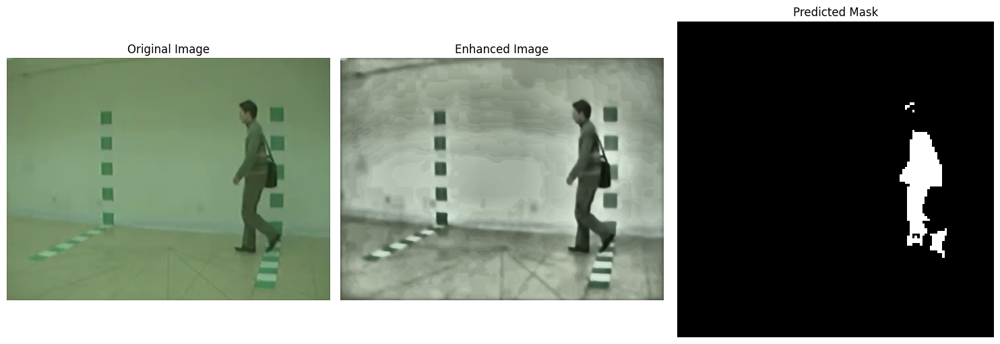


Processing: frame_0007.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 800ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


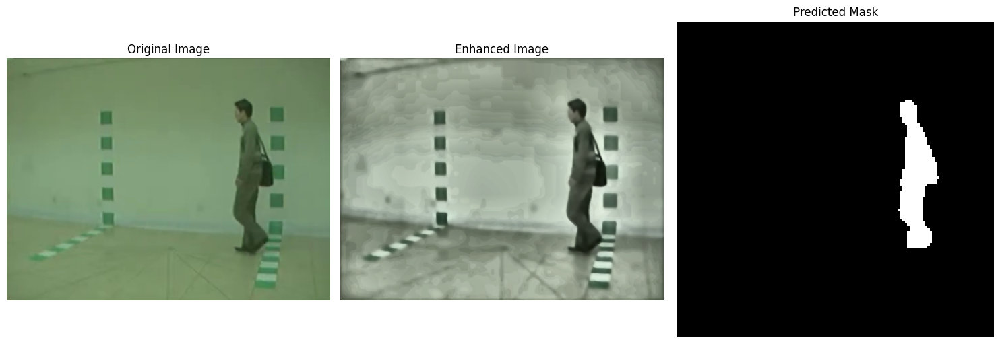


Processing: frame_0003.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


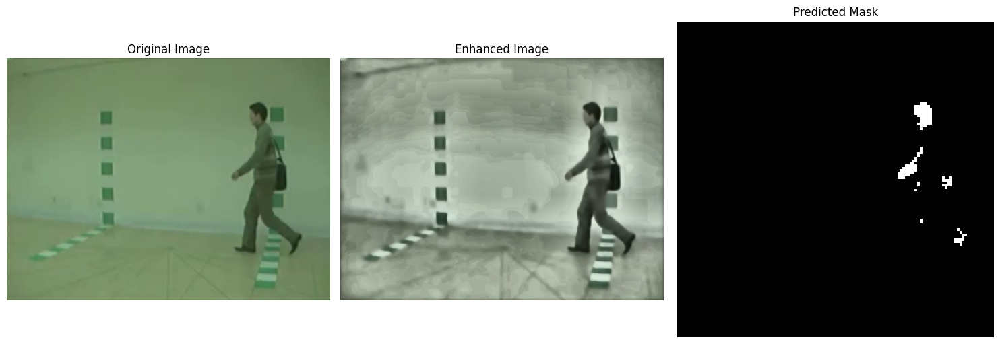


Processing: frame_0019.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


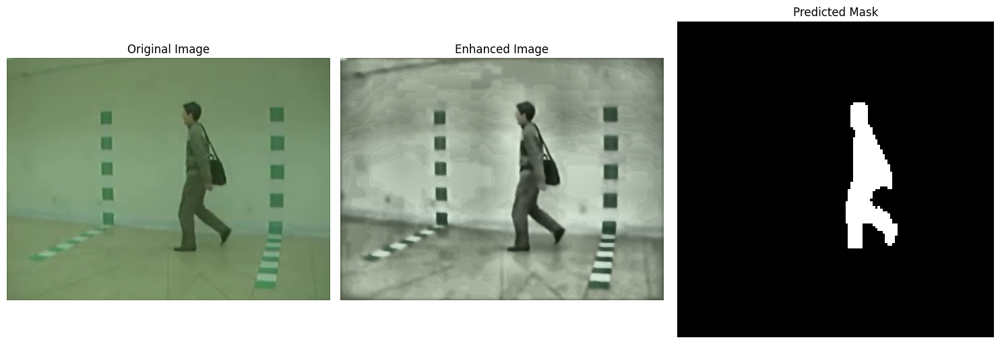


Processing: frame_0000.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


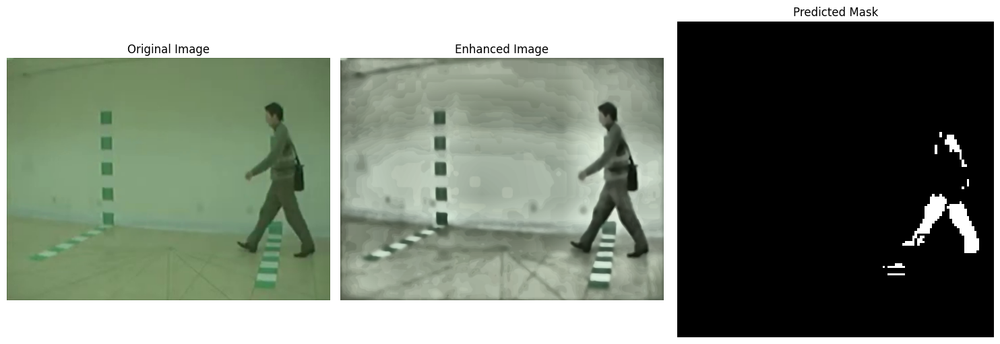


Processing: frame_0010.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


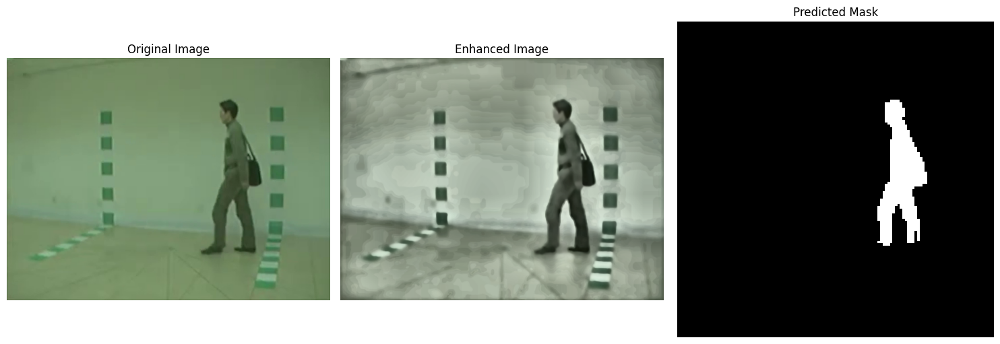


Processing: frame_0004.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


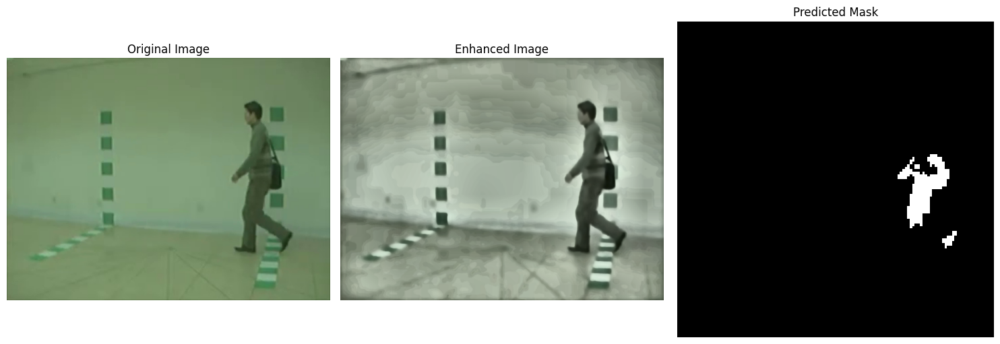


Processing: frame_0001.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


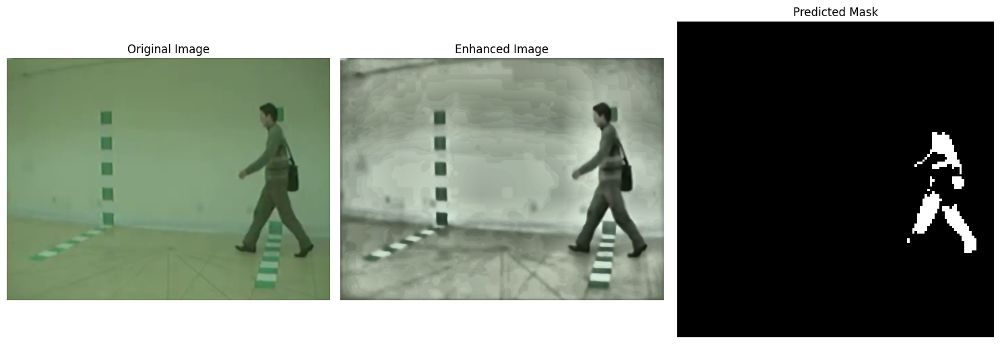


Processing: frame_0002.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


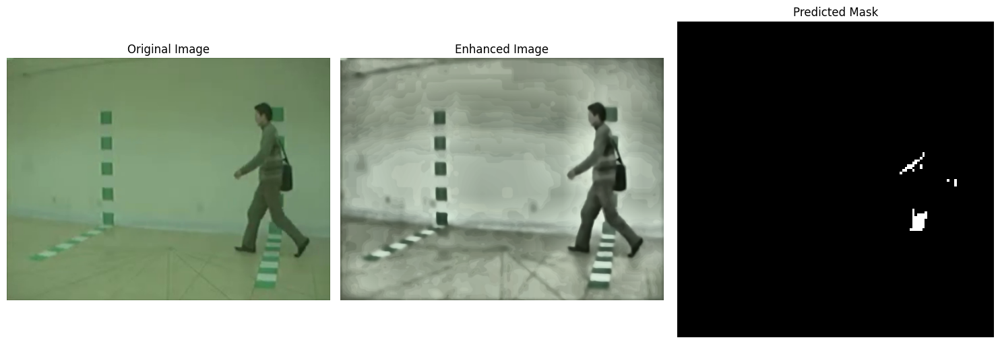


Processing: frame_0017.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


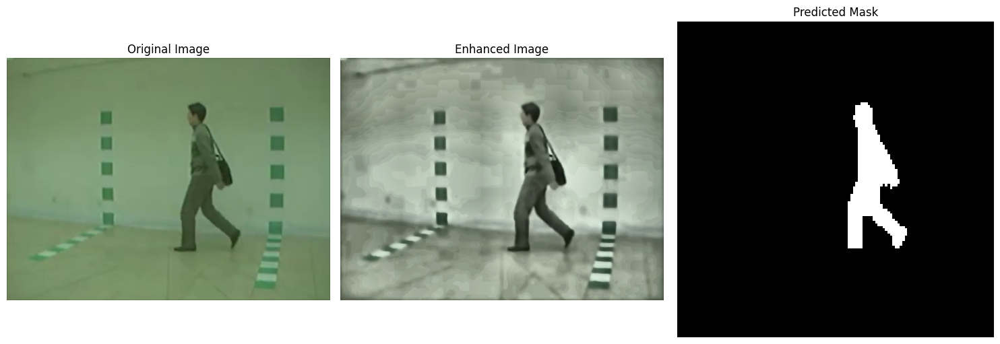


Processing: frame_0005.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


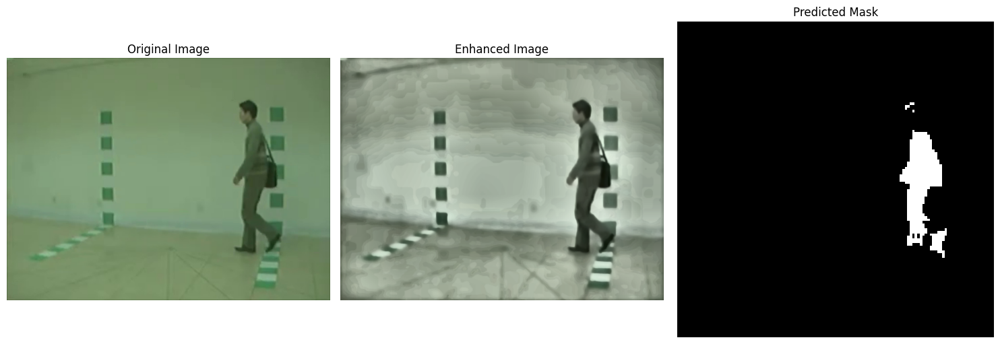


Processing: frame_0009.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


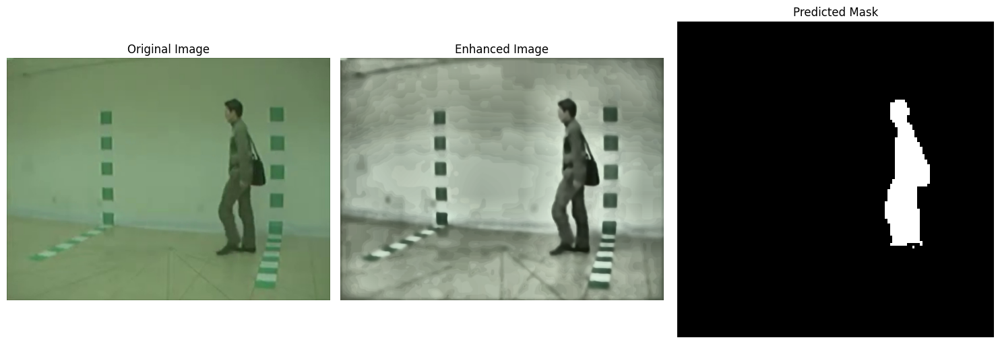


Processing: frame_0021.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


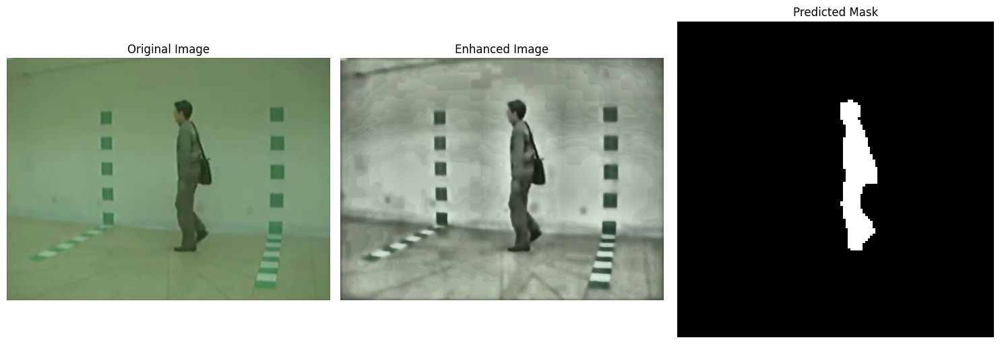


Processing: frame_0018.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


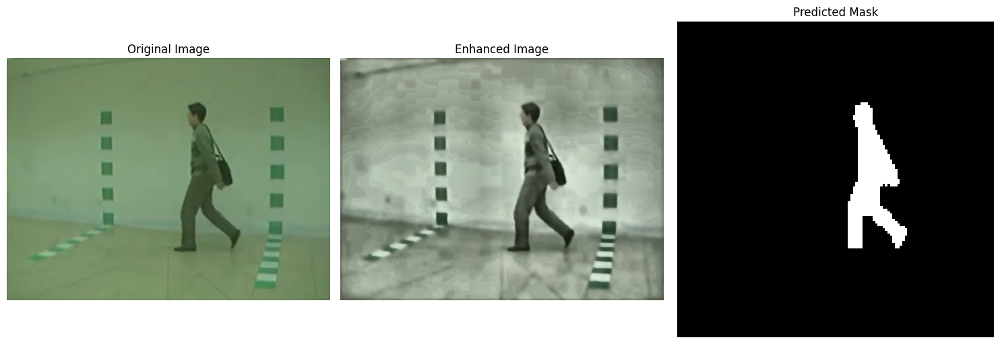


Processing: frame_0008.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


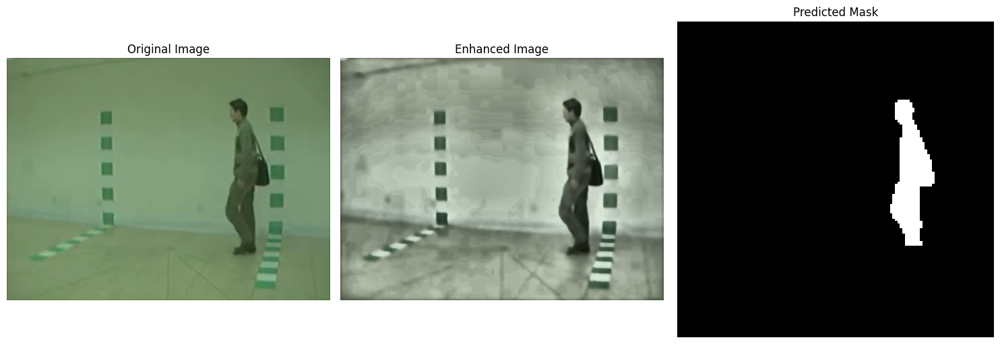


Processing: frame_0016.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


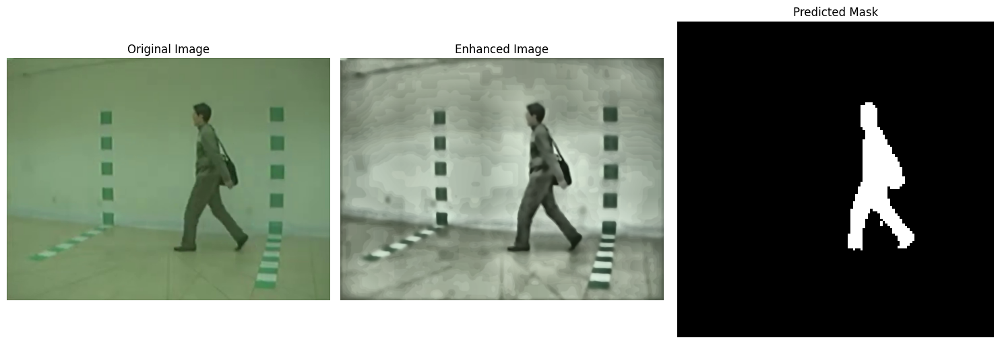


Processing: frame_0020.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


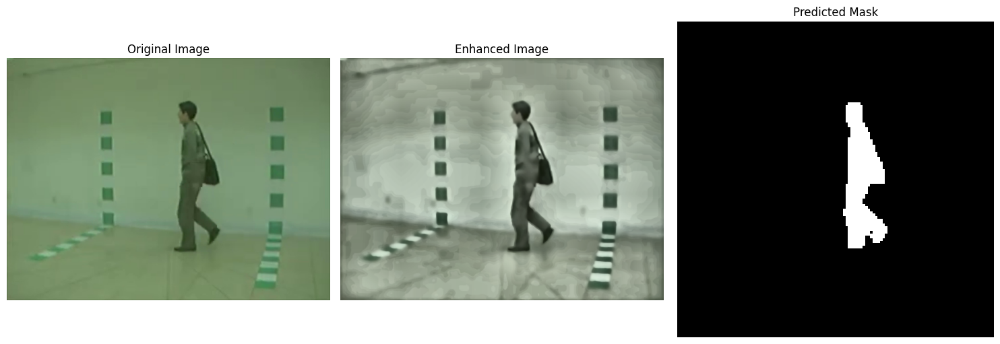


Processing: frame_0014.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


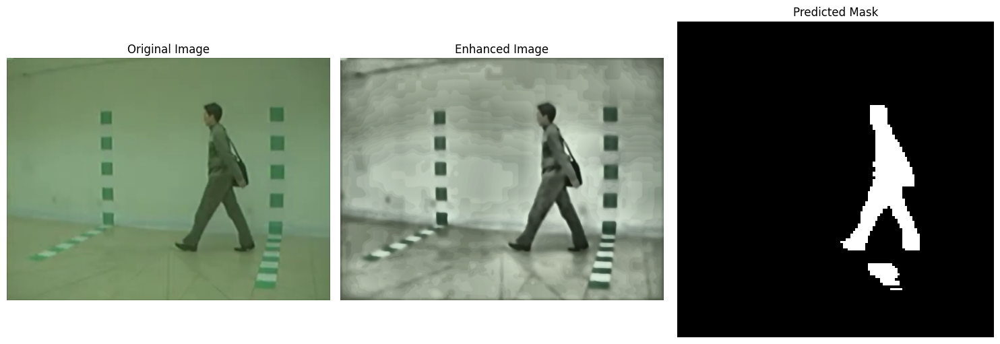


Processing: frame_0015.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


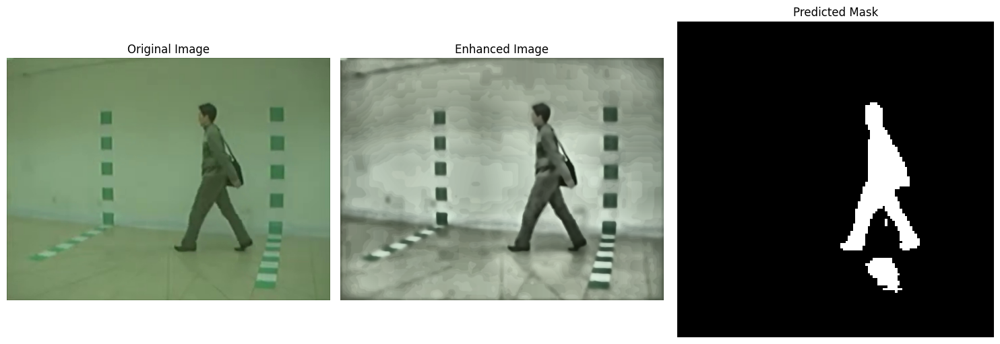


Processing: frame_0011.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


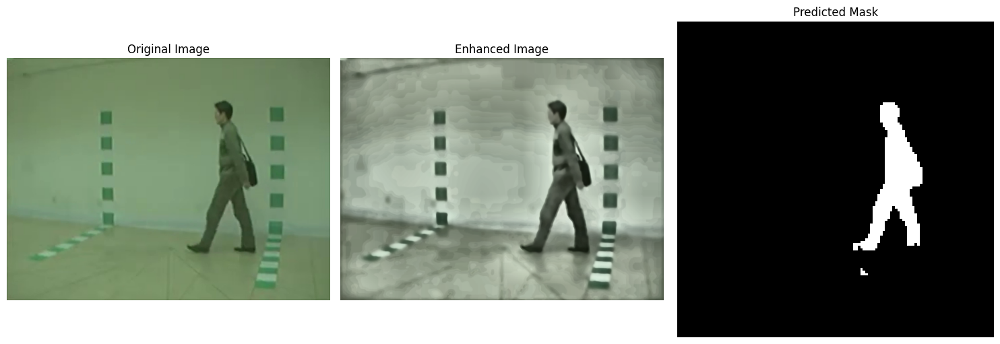


Processing: frame_0023.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


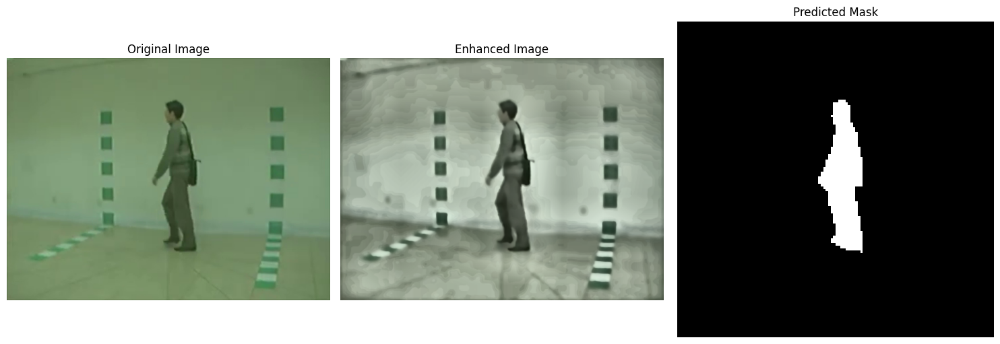


Processing: frame_0022.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


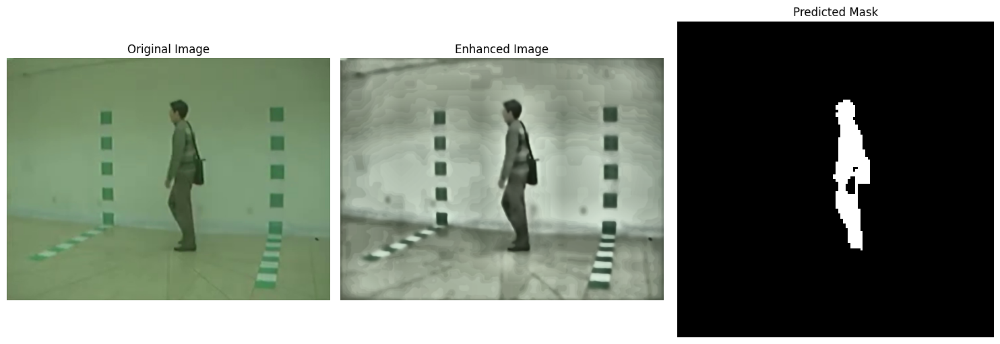


Processing: frame_0025.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


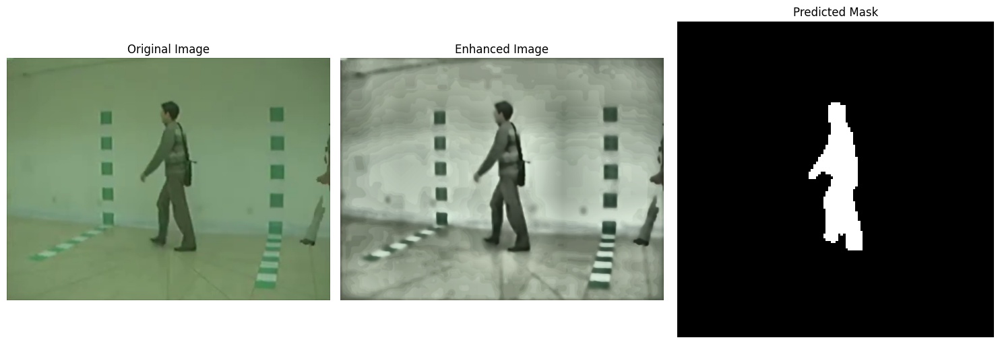


Processing: frame_0024.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


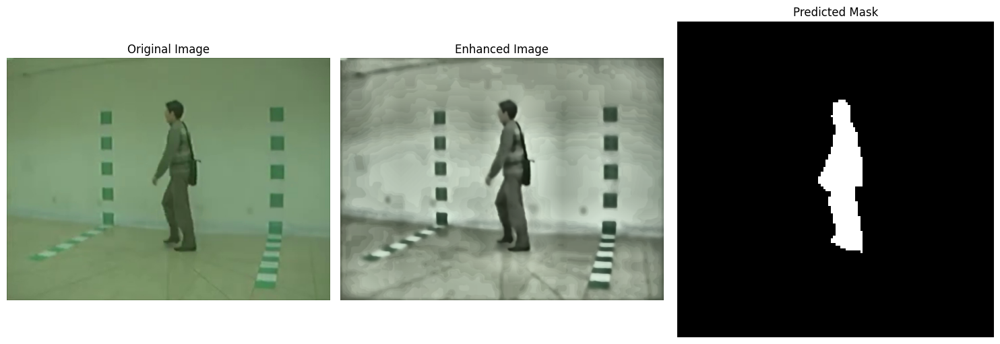

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

def adaptive_enhance_image(img):
    # Analyze image characteristics
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    brightness = np.mean(gray)
    contrast = np.std(gray)

    # Initial denoising with adaptive strength
    if contrast > 50:
        img_denoised = cv2.fastNlMeansDenoisingColored(img, None, 15, 15, 7, 21)
    else:
        img_denoised = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

    # Adjust parameters based on image characteristics
    if brightness < 100:  # Dark image
        clahe_limit = 3.0
        alpha = 1.3
        beta = 15
    elif brightness > 200:  # Bright image
        clahe_limit = 2.0
        alpha = 0.9
        beta = -5
    else:  # Normal image
        clahe_limit = 2.5
        alpha = 1.1
        beta = 5

    # Convert to LAB and enhance
    lab = cv2.cvtColor(img_denoised, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE with adaptive parameters
    clahe = cv2.createCLAHE(clipLimit=clahe_limit, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge channels
    lab = cv2.merge((l, a, b))
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

    # Apply bilateral filter with adaptive parameters
    if contrast > 50:
        enhanced = cv2.bilateralFilter(enhanced, 9, 75, 75)
    else:
        enhanced = cv2.bilateralFilter(enhanced, 5, 50, 50)

    # Adjust contrast and brightness
    enhanced = cv2.convertScaleAbs(enhanced, alpha=alpha, beta=beta)

    # Convert to grayscale for additional processing
    gray = cv2.cvtColor(enhanced, cv2.COLOR_RGB2GRAY)

    # Second CLAHE pass with mild settings
    clahe2 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
    enhanced_gray = clahe2.apply(gray)

    # Blend with color image
    enhanced_color = cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2RGB)
    enhanced = cv2.addWeighted(enhanced, 0.4, enhanced_color, 0.6, 0)

    # Final gentle bilateral filter
    enhanced = cv2.bilateralFilter(enhanced, 5, 50, 50)

    return enhanced

def preprocess_single_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Failed to load image at {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Store original for visualization
    original_img = img.copy()

    # Apply adaptive enhancement
    enhanced = adaptive_enhance_image(img)

    # Resize for model input (preserve aspect ratio)
    target_size = (128, 128)
    h, w = enhanced.shape[:2]
    aspect = w/h

    if aspect > 1:
        new_w = target_size[0]
        new_h = int(new_w/aspect)
    else:
        new_h = target_size[1]
        new_w = int(new_h*aspect)

    # Use LANCZOS interpolation for better quality downscaling
    enhanced_resized = cv2.resize(enhanced, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4)

    # Create blank target size image
    model_input = np.zeros((target_size[0], target_size[1], 3))

    # Calculate center offset
    x_offset = (target_size[0] - new_w) // 2
    y_offset = (target_size[1] - new_h) // 2

    # Place resized image in center
    model_input[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = enhanced_resized

    # Normalize to [0,1] with improved scaling
    model_input = (model_input - model_input.min()) / (model_input.max() - model_input.min() + 1e-8)

    return original_img, enhanced, model_input

def tta_predict(model, image_input):
    predictions = []

    # Original image
    pred = model.predict(np.expand_dims(image_input, axis=0))[0]
    predictions.append(pred)

    # Flipped image
    flipped = tf.image.flip_left_right(image_input)
    pred_flip = model.predict(np.expand_dims(flipped, axis=0))[0]
    pred_flip = tf.image.flip_left_right(pred_flip)
    predictions.append(pred_flip)

    # Slightly brighter
    brighter = tf.clip_by_value(image_input * 1.2, 0, 1)
    pred_bright = model.predict(np.expand_dims(brighter, axis=0))[0]
    predictions.append(pred_bright)

    # Slightly darker
    darker = tf.clip_by_value(image_input * 0.8, 0, 1)
    pred_dark = model.predict(np.expand_dims(darker, axis=0))[0]
    predictions.append(pred_dark)

    # Average all predictions
    avg_prediction = np.mean(predictions, axis=0)
    return avg_prediction

def ensemble_predict(model_dir, image_input, num_models=5):
    predictions = []
    # Use models from different epochs
    for epoch in range(17, 22):  # Using epochs 17-21
        model_path = f'{model_dir}/model_epoch_{epoch:02d}.h5'
        if os.path.exists(model_path):
            model = tf.keras.models.load_model(model_path, custom_objects={'iou_metric': iou_metric})
            pred = model.predict(np.expand_dims(image_input, axis=0))[0]
            predictions.append(pred)

    if not predictions:
        raise ValueError("No model checkpoints found")

    # Average predictions
    avg_prediction = np.mean(predictions, axis=0)
    return avg_prediction

def visualize_prediction(original_img, preprocessed_img, predicted_mask, save_path=None):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Preprocessed Image
    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Enhanced Image")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(tf.squeeze(predicted_mask), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def process_image(image_path, model_dir, save_results=True):
    try:
        # Preprocess image
        original_img, enhanced_img, model_input = preprocess_single_image(image_path)

        # Get predictions using both TTA and ensemble
        tta_pred = tta_predict(best_model, model_input)
        ensemble_pred = ensemble_predict(model_dir, model_input)

        # Combine predictions and apply threshold
        final_pred = (tta_pred + ensemble_pred) / 2.0
        final_pred = tf.cast(final_pred > 0.45, tf.float32)

        # Visualize results
        visualize_prediction(original_img, enhanced_img, final_pred)

        if save_results:
            # Create results directory if it doesn't exist
            save_dir = os.path.join(os.path.dirname(image_path), 'results')
            os.makedirs(save_dir, exist_ok=True)

            # Save enhanced image and prediction
            base_name = os.path.splitext(os.path.basename(image_path))[0]
            cv2.imwrite(os.path.join(save_dir, f'{base_name}_enhanced.jpg'),
                       cv2.cvtColor((enhanced_img * 255).astype(np.uint8), cv2.COLOR_RGB2BGR),
                       [cv2.IMWRITE_JPEG_QUALITY, 100])
            cv2.imwrite(os.path.join(save_dir, f'{base_name}_mask.png'),
                       (tf.squeeze(final_pred).numpy() * 255).astype(np.uint8),
                       [cv2.IMWRITE_PNG_COMPRESSION, 0])

        return final_pred

    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None

# Load the best model
best_model = tf.keras.models.load_model('/content/drive/MyDrive/segmentation/models/model_epoch_21.h5',
                                      custom_objects={'iou_metric': iou_metric})

# Process single image
image_path = '/content/drive/MyDrive/segmentation/frames/frame_0025.jpg'
model_dir = '/content/drive/MyDrive/segmentation/models'
result = process_image(image_path, model_dir)

# To process multiple images:

image_folder = '/content/drive/MyDrive/segmentation/frames'
for filename in os.listdir(image_folder):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(image_folder, filename)
        print(f"\nProcessing: {filename}")
        result = process_image(image_path, model_dir)


# XAI

In [ ]:
!pip install shap

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


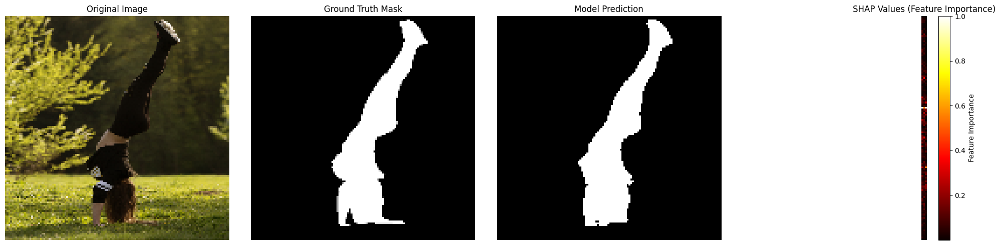

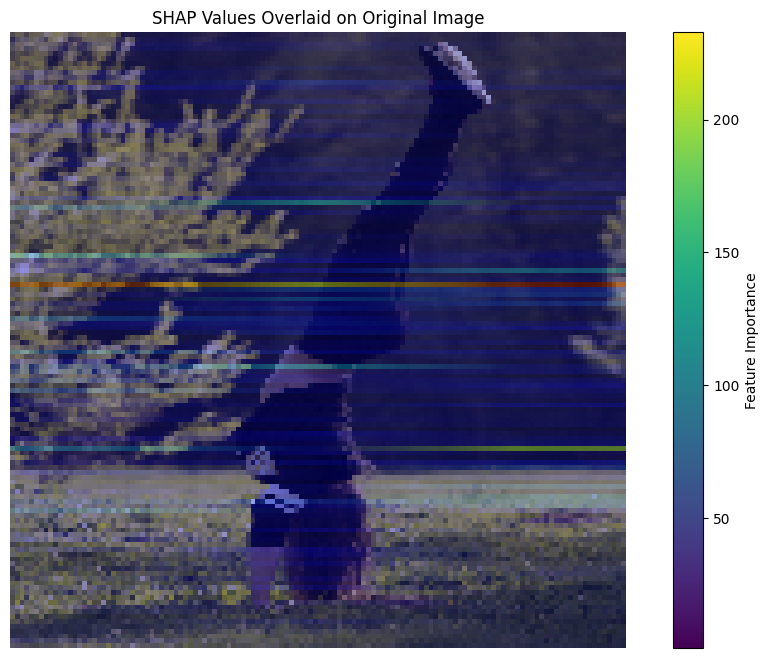

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━

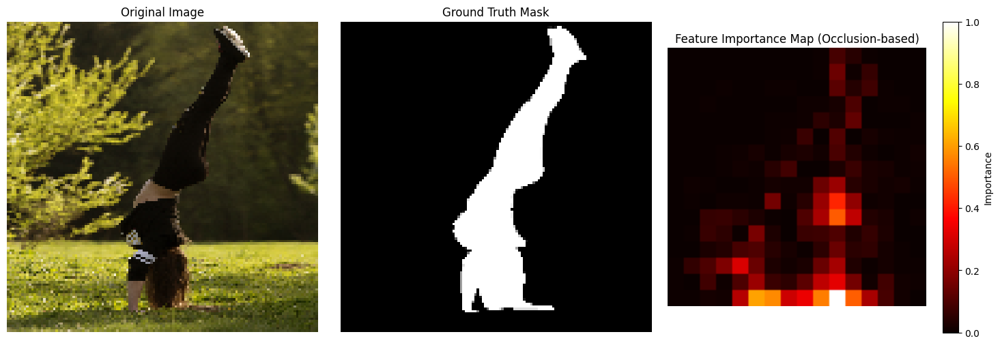

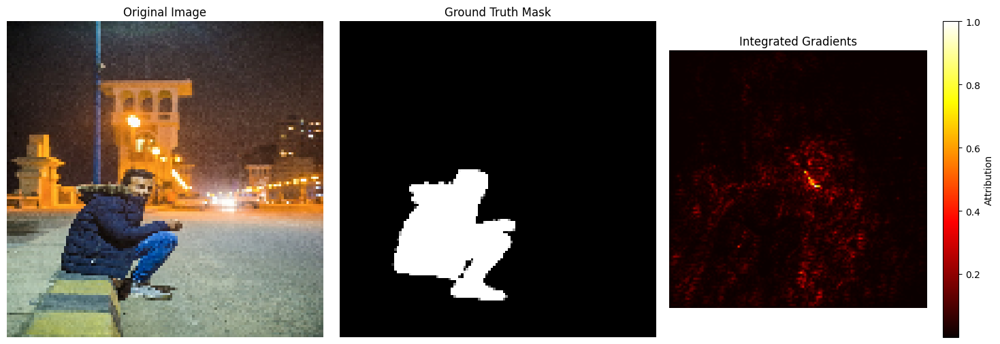

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


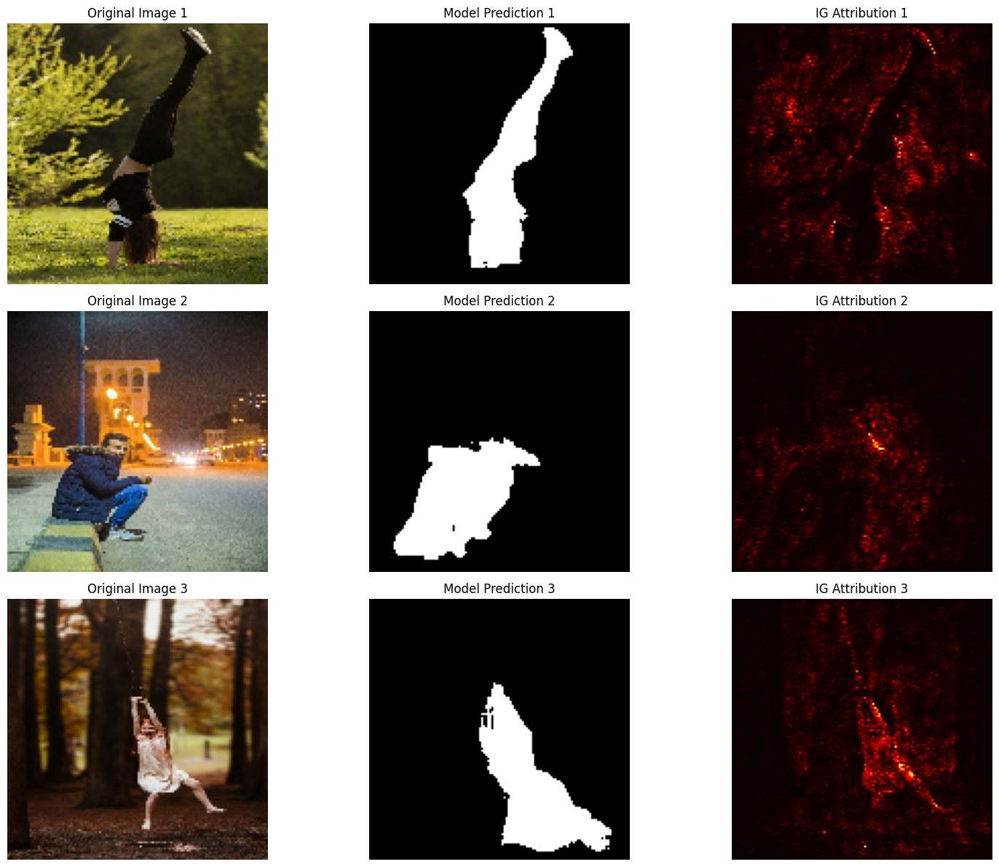

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


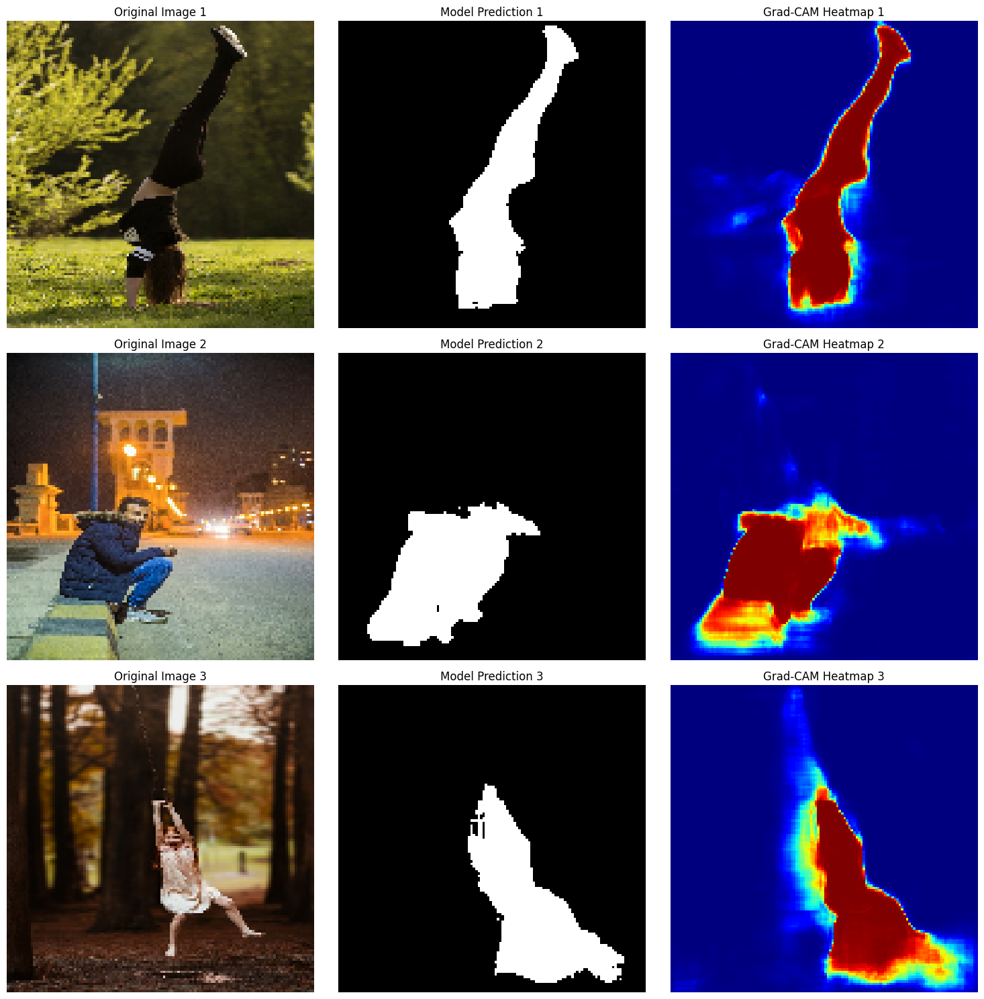

AttributeError: EagerTensor object has no attribute 'reshape'. 
        If you are looking for numpy-related methods, please run the following:
        tf.experimental.numpy.experimental_enable_numpy_behavior()
      

In [ ]:
# Install SHAP library if not already installed
!pip install shap

import tensorflow as tf
import numpy as np
import shap
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
import cv2
import os

# Load the trained model
model_path = '/content/drive/MyDrive/segmentation/models/model_epoch_25.h5'
model = load_model(model_path, custom_objects={"iou_metric": iou_metric})

# Get a few validation samples to explain
sample_images = []
sample_masks = []

for images, masks in val_dataset.take(1):  # Take one batch from validation dataset
    sample_images = images.numpy()
    sample_masks = masks.numpy()
    break

# Select a subset for SHAP analysis (SHAP can be computationally intensive)
num_samples = 3
subset_images = sample_images[:num_samples]

# Create a modified model that outputs a vector instead of a segmentation mask
# This is necessary because SHAP expects a vector output
def create_shap_model(model):
    # Get the output of the original model
    original_output = model.output
    # Add a global average pooling to convert the mask to a single value
    pooled_output = tf.keras.layers.GlobalAveragePooling2D()(original_output)
    # Create a new model
    shap_model = Model(inputs=model.input, outputs=pooled_output)
    return shap_model

# Create a model that outputs a vector for SHAP
shap_model = create_shap_model(model)

# Create an explainer using SHAP's GradientExplainer
explainer = shap.GradientExplainer(shap_model, subset_images)

# Calculate SHAP values for a sample image
sample_idx = 0
shap_values = explainer.shap_values(np.expand_dims(subset_images[sample_idx], axis=0))

# Run original model inference for comparison
pred_mask = model.predict(np.expand_dims(subset_images[sample_idx], axis=0))[0]
pred_mask = (pred_mask > 0.5).astype(np.float32)

# Visualize the SHAP values
plt.figure(figsize=(20, 5))

# Original image
plt.subplot(1, 4, 1)
plt.imshow(subset_images[sample_idx])
plt.title("Original Image")
plt.axis("off")

# Ground truth mask
plt.subplot(1, 4, 2)
plt.imshow(tf.squeeze(sample_masks[sample_idx]), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis("off")

# Model prediction
plt.subplot(1, 4, 3)
plt.imshow(tf.squeeze(pred_mask), cmap='gray')
plt.title("Model Prediction")
plt.axis("off")

# SHAP visualization
plt.subplot(1, 4, 4)
shap_image = shap_values[0][0]
shap_magnitude = np.abs(shap_image).sum(axis=-1)
shap_magnitude = shap_magnitude / shap_magnitude.max()
plt.imshow(shap_magnitude, cmap='hot')
plt.title("SHAP Values (Feature Importance)")
plt.colorbar(label="Feature Importance")
plt.axis("off")

plt.tight_layout()
plt.show()

# Alternative visualization: SHAP values overlaid on the original image
plt.figure(figsize=(12, 8))

# Create a heatmap of SHAP values
shap_abs = np.abs(shap_values[0][0]).sum(axis=-1)
shap_norm = shap_abs / shap_abs.max()

# Convert to heatmap
heatmap = cv2.applyColorMap(np.uint8(255 * shap_norm), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

# Original image for overlay
orig_img = (subset_images[sample_idx] * 255).astype(np.uint8)

# Ensure heatmap is the same size as the original image
heatmap_resized = cv2.resize(heatmap, (orig_img.shape[1], orig_img.shape[0]))

# Overlay heatmap on original image
alpha = 0.4  # Transparency factor
overlay = cv2.addWeighted(orig_img, 1 - alpha, heatmap_resized, alpha, 0)

plt.imshow(overlay)
plt.title("SHAP Values Overlaid on Original Image")
plt.axis("off")
plt.colorbar(label="Feature Importance")
plt.show()

# Calculate feature importance on a more granular level
# This shows which parts of the image contribute most to the segmentation decision
def calculate_feature_importance(model, img, mask_threshold=0.5):
    # Get the original prediction
    orig_pred = model.predict(tf.expand_dims(img, axis=0))[0]
    orig_pred_binary = (orig_pred > mask_threshold).astype(np.float32)
    orig_coverage = np.mean(orig_pred_binary)

    # Create importance map
    importance_map = np.zeros((img.shape[0], img.shape[1]))
    patch_size = 8  # Size of patches to occlude

    for y in range(0, img.shape[0], patch_size):
        for x in range(0, img.shape[1], patch_size):
            # Create a copy of the image with this patch occluded (set to black)
            occluded_img = img.copy()
            y_end = min(y + patch_size, img.shape[0])
            x_end = min(x + patch_size, img.shape[1])
            occluded_img[y:y_end, x:x_end, :] = 0.0

            # Get prediction with occlusion
            occluded_pred = model.predict(tf.expand_dims(occluded_img, axis=0))[0]
            occluded_pred_binary = (occluded_pred > mask_threshold).astype(np.float32)
            occluded_coverage = np.mean(occluded_pred_binary)

            # Calculate change in prediction and assign to importance map
            change = abs(occluded_coverage - orig_coverage)
            importance_map[y:y_end, x:x_end] = change

    # Normalize importance map
    importance_map = importance_map / importance_map.max()
    return importance_map

# Calculate and visualize feature importance map
importance_map = calculate_feature_importance(model, subset_images[sample_idx])

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(subset_images[sample_idx])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(tf.squeeze(sample_masks[sample_idx]), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(importance_map, cmap='hot')
plt.title("Feature Importance Map (Occlusion-based)")
plt.colorbar(label="Importance")
plt.axis("off")

plt.tight_layout()
plt.show()

# Try an alternative explainability approach: Integrated Gradients
# This is often better for image data than the standard SHAP approach

def integrated_gradients(img, model, steps=50):
    """
    Calculate integrated gradients for an image to explain model predictions
    """
    # Create a baseline image (black image)
    baseline = np.zeros_like(img)

    # Create interpolated images between baseline and input
    alphas = np.linspace(0, 1, steps)
    interpolated_imgs = np.array([baseline + alpha * (img - baseline) for alpha in alphas])

    with tf.GradientTape() as tape:
        # Convert to tensor and mark as trainable
        interp_tensors = tf.convert_to_tensor(interpolated_imgs, dtype=tf.float32)
        tape.watch(interp_tensors)

        # Get predictions
        preds = model(interp_tensors)
        # Use average prediction for segmentation mask
        target = tf.reduce_mean(preds, axis=[1, 2, 3])

    # Calculate gradients
    grads = tape.gradient(target, interp_tensors)

    # Approximate the integral using the trapezoidal rule
    grads = (grads[:-1] + grads[1:]) / 2.0
    avg_grads = tf.reduce_mean(grads, axis=0)

    # Scale gradients by the input difference from baseline
    integrated_grads = avg_grads * (img - baseline)

    return integrated_grads

# Calculate integrated gradients for a sample image
sample_idx = 1
ig_attributions = integrated_gradients(subset_images[sample_idx], model)

# Visualize the results
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(subset_images[sample_idx])
plt.title("Original Image")
plt.axis("off")

# Ground truth mask
plt.subplot(1, 3, 2)
plt.imshow(tf.squeeze(sample_masks[sample_idx]), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis("off")

# Integrated Gradients visualization
plt.subplot(1, 3, 3)
# Aggregate attributions across color channels and take absolute value
attr_magnitude = np.abs(ig_attributions).sum(axis=-1)
# Normalize for better visualization
attr_magnitude = attr_magnitude / attr_magnitude.max()
plt.imshow(attr_magnitude, cmap='hot')
plt.title("Integrated Gradients")
plt.colorbar(label="Attribution")
plt.axis("off")

plt.tight_layout()
plt.show()

# Multi-sample analysis with Integrated Gradients
plt.figure(figsize=(16, 4 * num_samples))

for i in range(num_samples):
    # Calculate integrated gradients for this sample
    ig_attr = integrated_gradients(subset_images[i], model)
    attr_magnitude = np.abs(ig_attr).sum(axis=-1)
    attr_magnitude = attr_magnitude / attr_magnitude.max()

    # Get model prediction
    pred_mask = model.predict(tf.expand_dims(subset_images[i], axis=0))[0]
    pred_mask = (pred_mask > 0.5).astype(np.float32)

    # Original image
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.imshow(subset_images[i])
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    # Model prediction
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.imshow(tf.squeeze(pred_mask), cmap='gray')
    plt.title(f"Model Prediction {i+1}")
    plt.axis("off")

    # Integrated Gradients visualization
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.imshow(attr_magnitude, cmap='hot')
    plt.title(f"IG Attribution {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Generate class activation maps for a specific prediction
from tensorflow.keras.models import Model

# Get the last convolutional layer
last_conv_layer = None
for layer in reversed(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer = layer.name
        break

# Create a model that outputs both the final predictions and the activations of the last conv layer
grad_model = Model(
    inputs=model.inputs,
    outputs=[model.get_layer(last_conv_layer).output, model.output]
)

# Function to compute the class activation map
def make_gradcam_heatmap(img_array, grad_model):
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        # We'll use the mean prediction as our target for visualization
        target_class = tf.reduce_mean(preds)

    # Gradient of the target with respect to the output of the last conv layer
    grads = tape.gradient(target_class, last_conv_layer_output)

    # Importance weights: global average pooling of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight the channels by importance and sum
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Generate and display Grad-CAM heatmaps for all samples
plt.figure(figsize=(15, 5 * num_samples))

for i in range(num_samples):
    # Get model prediction
    sample_img = tf.expand_dims(subset_images[i], axis=0)
    pred_mask = model.predict(sample_img)[0]
    pred_mask = (pred_mask > 0.5).astype(np.float32)

    # Generate Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(sample_img, grad_model)

    # Original image
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.imshow(subset_images[i])
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    # Model prediction
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.imshow(tf.squeeze(pred_mask), cmap='gray')
    plt.title(f"Model Prediction {i+1}")
    plt.axis("off")

    # Grad-CAM heatmap
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.imshow(heatmap, cmap='jet')
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# For a comprehensive view, overlay all explanation methods on one sample
sample_idx = 0
sample_img = tf.expand_dims(subset_images[sample_idx], axis=0)

# Get all explanations
# 1. SHAP values
shap_values_sample = explainer.shap_values(sample_img)
shap_abs = np.abs(shap_values_sample[0][0]).sum(axis=-1)
shap_norm = shap_abs / shap_abs.max()

# 2. Integrated Gradients
ig_attr = integrated_gradients(subset_images[sample_idx], model)
ig_magnitude = np.abs(ig_attr).sum(axis=-1)
ig_norm = ig_magnitude / ig_magnitude.max()

# 3. Grad-CAM
gradcam_heatmap = make_gradcam_heatmap(sample_img, grad_model)

# 4. Occlusion-based importance
importance_map = calculate_feature_importance(model, subset_images[sample_idx])

# Get model prediction
pred_mask = model.predict(sample_img)[0]
pred_mask = (pred_mask > 0.5).astype(np.float32)

# Visualize all methods side by side
plt.figure(figsize=(20, 10))

# Row 1: Original image and model prediction
plt.subplot(2, 3, 1)
plt.imshow(subset_images[sample_idx])
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(tf.squeeze(sample_masks[sample_idx]), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(tf.squeeze(pred_mask), cmap='gray')
plt.title("Model Prediction")
plt.axis("off")

# Row 2: All explanation methods
plt.subplot(2, 3, 4)
plt.imshow(shap_norm, cmap='hot')
plt.title("SHAP Values")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(ig_norm, cmap='hot')
plt.title("Integrated Gradients")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(gradcam_heatmap, cmap='jet')
plt.title("Grad-CAM")
plt.axis("off")

plt.tight_layout()
plt.suptitle("Comparing Different Explainability Methods", fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

print(f"Input shape: {model_input.shape}")  # Should be (1, 128, 128, 3)